In [1]:
import numpy as np
import matplotlib.pyplot as plt
import igraph as ig

# biological networks
The term "biological networks" describes the interdependent systems found in living things; these systems are sometimes shown as intricate webs made up of molecules, genes, proteins, or other biological components. comprehension of diverse biological processes, such as cellular activities, signaling routes, and connections between multiple parts inside an organism, requires a comprehension of these networks.

There are several types of biological networks:
* Gene Regulatory Networks
* Protein-Protein Interaction Networks
* Metabolic Networks
* Signaling Networks
* Neural Networks
* Phylogenetic networks

In [2]:
def network_to_dict(file):
    network = {}
    with open(file, 'r') as fi: 
        for line in fi: 
            a, b = line.strip().split(',') 
            network.setdefault(a, set()).add(b) 
            network.setdefault(b, set()).add(a) 
 
    int_keys, sorted_int_keys = [], []
    str_keys, sorted_str_keys = [], []

    # Separate keys by type: integers and strings
    for key in network.keys():
        if key.isnumeric(): 
            int_keys.append(key)

        else: 
            str_keys.append(key)
    
    sorted_int_keys = sorted(int_keys, key=int)
    sorted_str_keys = sorted(str_keys)

    # Create a new dictionary with sorted keys
    sorted_dict = {key: network[key] for key in sorted_int_keys + sorted_str_keys}

    return sorted_dict

In [3]:
network_1 = network_to_dict('reseau1.txt')
network_2 = network_to_dict('reseau2.txt')
network_3 = network_to_dict('reseau3.txt')

## Degree distribution

In [4]:
# network_distribution function 
# input: network dictionary
# output: nodes list and degree lis
def network_distribution(network_dict):
    degree = []
    for key in network_dict:
        degree.append(len(network_dict[key]))
    return list(network_dict.keys()), degree

In [5]:
node_n1, degree_n1 = network_distribution(network_1)
node_n2, degree_n2 = network_distribution(network_2)
node_n3, degree_n3 = network_distribution(network_3)

In [6]:
def plot_network_distribution(network, networks_name, every_nth = None):
    
    node_list, degree_list = network_distribution(network)
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))  # Adjust figsize as needed
    fig.suptitle('Degree Distribution of '+networks_name) 

    axs[0].scatter(node_list, degree_list, s=50)  # Scatter plot on the first subplot
    axs[0].set_title('Scatter Plot')  # Set title for the first subplot

    axs[1].bar(node_list, degree_list)  # Bar plot on the second subplot
    axs[1].set_title('Bar Plot')  # Set title for the second subplot
    

    if every_nth != None:
        axs[0].set_xticks(node_list[::every_nth])
        axs[0].set_xticklabels(node_list[::every_nth], rotation=45) 
        axs[1].set_xticks(node_list[::every_nth])
        axs[1].set_xticklabels(node_list[::every_nth], rotation=45)
    else: 
        axs[0].set_xticklabels(node_list, rotation=60) 
        axs[1].set_xticklabels(node_list, rotation=60) 

    plt.tight_layout()  # Adjust subplot parameters to give specified padding
    plt.show()

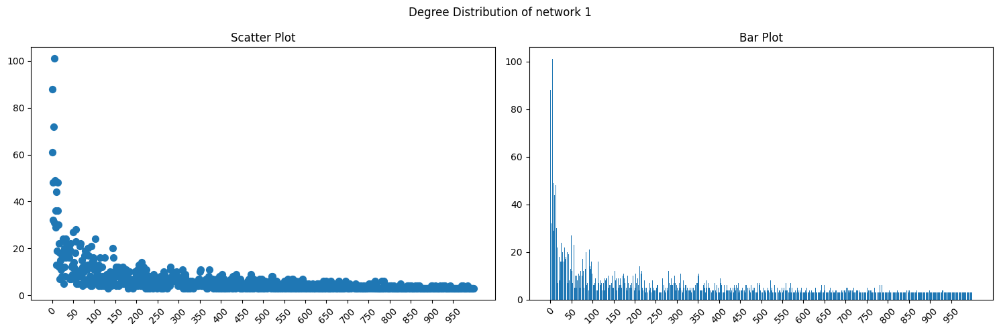

In [7]:
plot_network_distribution(network_1, networks_name = 'network 1', every_nth = 50)

* We observe that the first network can be scale-free because it follows Poisson distribution. We can see the initial nodes with a very high degree of distribution, while the subsequent ones have much less. 

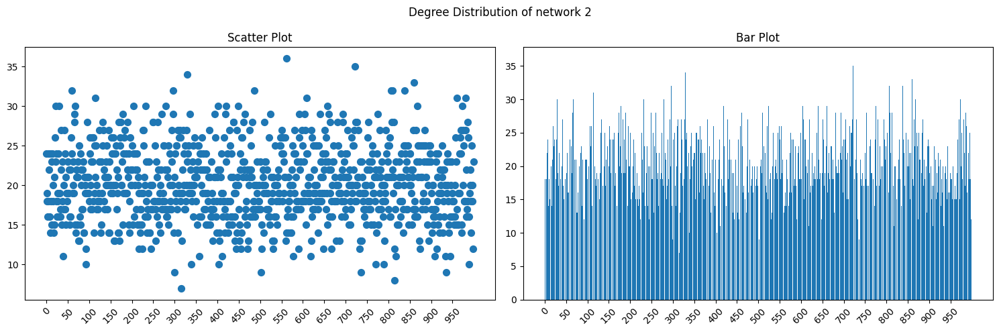

In [8]:
plot_network_distribution(network_2, networks_name = 'network 2', every_nth = 50)

* For the second network, it is a random graph, the nodes degree of distribution is generally around 18 connections.

C:\Users\DELL\AppData\Local\Temp\ipykernel_22008\2378766943.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0].set_xticklabels(node_list, rotation=60)
C:\Users\DELL\AppData\Local\Temp\ipykernel_22008\2378766943.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1].set_xticklabels(node_list, rotation=60)


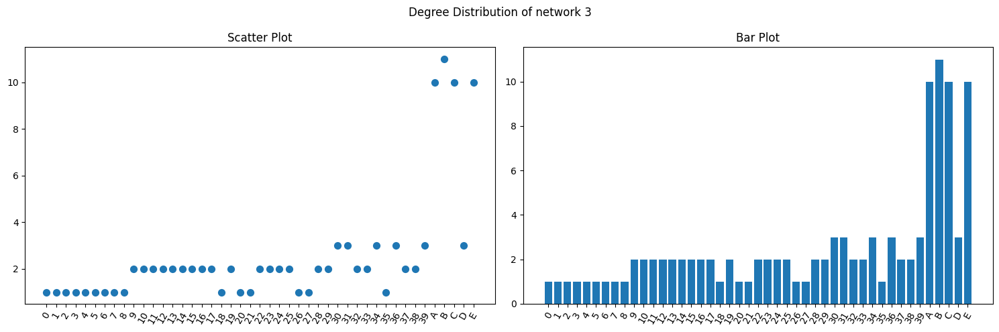

In [9]:
plot_network_distribution(network_3, networks_name = 'network 3')

* For the third network, it is a Scale Free model. We observe that distribution the follows a power law .

## Clustering coefficient
The clustering coefficient C is defined as the average probability that two neighbors of a node are connected to each other. It is calculated as follows:
$$C_{v} = \frac{2E_{v}}{d_{v}(d_{v}-1)}$$
where: 
* $v$ is a node in the network.
* $E_{v}$ is the number of edges between neighbors of $v$. 
* $d_{v}$ is the number of neighbors of node $v$.

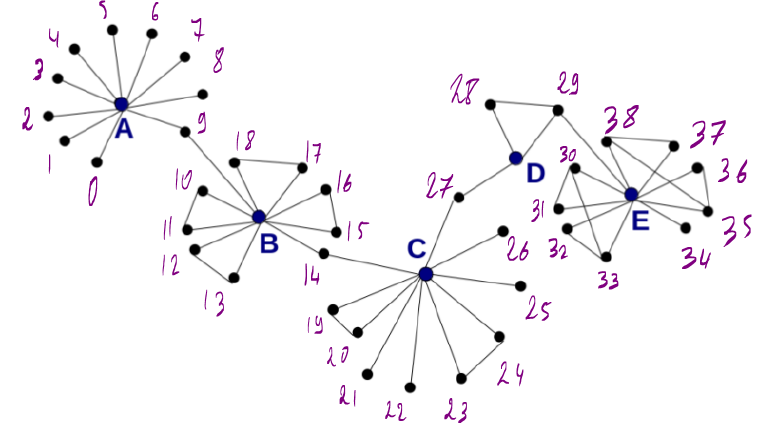

$C_{A} = \frac{2 \times E_{A}}{d_{A}(d_{A}-1)} = \frac{2 \times 0}{10\times(10-1)} = 0$ \
$C_{B} = \frac{2 \times E_{B}}{d_{B}(d_{B}-1)} = \frac{2 \times 4}{10\times(10-1)} = \frac{4}{45} \sim 0.0888$ \
$C_{C} = \frac{2 \times E_{C}}{d_{C}(d_{C}-1)} = \frac{2 \times 2}{10\times(10-1)} = \frac{2}{45} \sim 0.0444$ \
$C_{D} = \frac{2 \times E_{D}}{d_{D}(d_{D}-1)} = \frac{2 \times 1}{3\times(3-1)} = \frac{1}{3} \sim 0.333$ \
$C_{E} = \frac{2 \times E_{E}}{d_{E}(d_{E}-1)} = \frac{2 \times 6}{10\times(10-1)} = \frac{2}{15} \sim 0.133$  


In [10]:
def nbr_edges_between_v_neighboors(network,v):
    e = 0
    # get v nodes neighboors 
    v_neighboors = network[v].copy()
    while len(v_neighboors) != 0:
        # u is a v neighboors node
        u = next(iter(v_neighboors))
        # get u nodes neighboors
        u_neighboors = network[u]
        # number of edges between n v nodes neighboors are the intersction between u_neighboors and v_neighboors
        e += len(u_neighboors.intersection(v_neighboors))        
        # remove u from the list (because an edge uv is the same as vu in undirected graph)
        v_neighboors.pop()
    return e



def clustering_coefficient(network):
    nodes, degree = network_distribution(network)
    clustering_coefficient_list = []
    # for each node 
    for i in range(len(nodes)):
        v = nodes[i]
        # d_v : degree of node v
        d_v = degree[i]
        if d_v == 1: 
            clustering_coefficient_v = 0
        else:
            # e_v : number of edges between node's neighboors
            e_v = nbr_edges_between_v_neighboors(network,v)
            # calculate the clustering coefficient of node v
            clustering_coefficient_v = (2*e_v)/(d_v*(d_v-1))

        # add clustering_coefficient to the list
        clustering_coefficient_list.append(clustering_coefficient_v) 
    return clustering_coefficient_list

* High clustering coefficient:
* Low clustering coefficient: 

In [11]:
# input: network: dictionary (key-> node, value-> neighbors)
#        threshold to define a node as a hub
# output: plot a graph using igraph
def plot_graph(network, threshold=5):

    # Get nodes and degrees of network
    nodes, degree = network_distribution(network)

    # Create an empty directed graph
    g = ig.Graph(directed=False)

    # Add vertices (nodes) to the graph
    g.add_vertices(nodes)

    added_edges = set()
    # Add edges based on the network dictionary
    for node, neighbors in network.items():
        for neighbor in neighbors:
            if (node, neighbor) not in added_edges and (neighbor, node) not in added_edges:
                g.add_edge(node, neighbor)
                added_edges.add((node, neighbor))

    # Define node colors based on their degrees
    node_colors = ['blue' if deg <= threshold else 'red' for deg in degree]

    # Plot the graph with node colors
    visual_style = {
        "vertex_color": node_colors,  # Color nodes based on their degree
        "vertex_label": nodes,
        "bbox": (600, 600),
        "margin": 20,
        "layout": g.layout("kk"),  # Kamada-Kawai layout
    }

    return ig.plot(g, **visual_style)

network 3


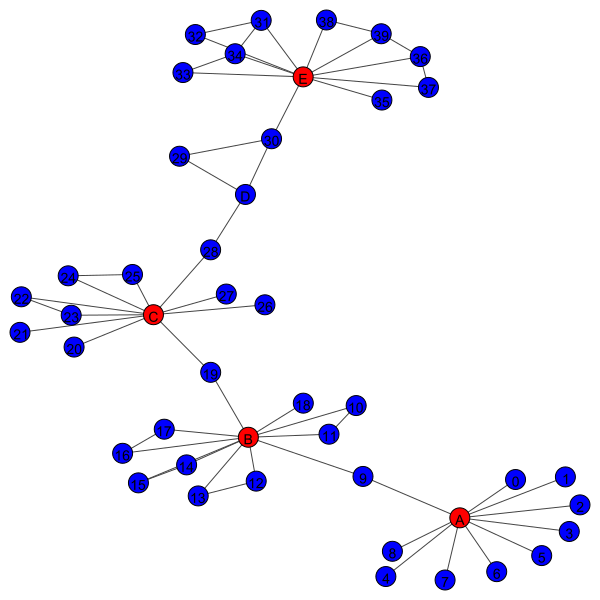

In [12]:
print("network 3")
plot_graph(network_3)

In [13]:
clustering_coefficient_list = clustering_coefficient(network_3)
print("clustering coefficient of node")
for i in range(len(clustering_coefficient_list)):
    print("C(",node_n3[i],") = ",clustering_coefficient_list[i])

clustering coefficient of node
C( 0 ) =  0
C( 1 ) =  0
C( 2 ) =  0
C( 3 ) =  0
C( 4 ) =  0
C( 5 ) =  0
C( 6 ) =  0
C( 7 ) =  0
C( 8 ) =  0
C( 9 ) =  0.0
C( 10 ) =  1.0
C( 11 ) =  1.0
C( 12 ) =  1.0
C( 13 ) =  1.0
C( 14 ) =  1.0
C( 15 ) =  1.0
C( 16 ) =  1.0
C( 17 ) =  1.0
C( 18 ) =  0
C( 19 ) =  0.0
C( 20 ) =  0
C( 21 ) =  0
C( 22 ) =  1.0
C( 23 ) =  1.0
C( 24 ) =  1.0
C( 25 ) =  1.0
C( 26 ) =  0
C( 27 ) =  0
C( 28 ) =  0.0
C( 29 ) =  1.0
C( 30 ) =  0.3333333333333333
C( 31 ) =  0.6666666666666666
C( 32 ) =  1.0
C( 33 ) =  1.0
C( 34 ) =  0.6666666666666666
C( 35 ) =  0
C( 36 ) =  0.6666666666666666
C( 37 ) =  1.0
C( 38 ) =  1.0
C( 39 ) =  0.6666666666666666
C( A ) =  0.0
C( B ) =  0.07272727272727272
C( C ) =  0.044444444444444446
C( D ) =  0.3333333333333333
C( E ) =  0.13333333333333333


In [14]:
def avrage_clustering_coefficient(network):
    clustering_coefficient_list = clustering_coefficient(network)
    return sum(clustering_coefficient_list)/len(clustering_coefficient_list)

In [15]:
networks = [network_1,network_2,network_3]
for i in range(len(networks)):
    print("avrage clustering coefficient of network",i+1,"is",avrage_clustering_coefficient(networks[i]))

avrage clustering coefficient of network 1 is 0.027004490481315802
avrage clustering coefficient of network 2 is 0.020351746799949482
avrage clustering coefficient of network 3 is 0.45741863075196415


* the average clustering coefficients between different networks can help identify distinct patterns or features.
    * A high average suggests that nodes in a graph tend to form dense and highly connected clusters.
    * A lower average indicates that the graph tends to be less dense, with looser connections between nodes.
* However, 
    * in general, for random graphs generated using models like Erdős-Rényi, the average clustering coefficient tends to be relatively small, especially in comparison to real-world networks. These what we observe in network 1 and 2.
    * Scale-free models like Barab ́asi–Albert, that characterized by a power-law degree distribution and hubs , often exhibit high clustering coefficients for their nodes despite having a scale-free structure. These what we observe in network 3.


## Betweenness centrality

Betweenness centrality is a centrality measure of a node that acts as a bridge along the shortest path between two other nodes.[[1]](https://www.sciencedirect.com/topics/computer-science/betweenness-centrality#:~:text=Betweenness%20centrality%20is%20a%20centrality,\)%20(Second%20Edition)%2C%202021)
The type of nodes that highlight betweenness centrality are those that act as connectors between different parts of a network. Furthermore using betweenness centrality can aid in detecting communities within a network.


* For each pair of nodes in the network, find the shortest path(s) between them

* By convention, let  $\sigma_{st}$ denote the number of shortest paths between nodes $s$ and t in a graph $G$, and $\sigma_{st} (v)$ represent the number of shortest paths between nodes $s$ and $t$ passing through $v$ (assuming here that $s ≠ t ≠ v$).  The betweenness centrality of a node v is then defined by the following formula:
$$ BC(v)= \sum_{s≠t≠v} \frac{\sigma_{st}(v)}{\sigma_{st}}$$

Note that a network with a few nodes exhibiting high centrality is not necessarily robust. Their removal might significantly disrupt the network.






-----

In [16]:
def breadth_first_search(network,s):
    visited = []
    queue = [s]
    print("visited",visited)
    print("queue",queue)
    print("------------------------")
    while len(queue) != 0:
        visited.extend(queue)
        new_queue = []
        for v in queue:
            v_neighbor = network[v]
            new_queue.extend([x for x in v_neighbor if x not in visited if x not in new_queue])

        queue = new_queue
        print("visited",visited)
        print("queue",queue)
        print("------------------------")


In [17]:
network_g = {
    'A': {'B', 'C'},
    'B': {'A','C', 'D'},
    'C': {'A','B', 'E'},
    'D': {'B', 'E'},
    'E': {'C', 'D'}
}
breadth_first_search(network_g,'B')

visited []
queue ['B']
------------------------
visited ['B']
queue ['C', 'D', 'A']
------------------------
visited ['B', 'C', 'D', 'A']
queue ['E']
------------------------
visited ['B', 'C', 'D', 'A', 'E']
queue []
------------------------


In [18]:
def breadth_first_search_paths(network,s):
    visited = []
    queue = [s]
    
    paths = [[s]]
    i = 0 
    while len(queue) != 0:
        visited.extend(queue)
        new_queue = []
        for v in queue:

            v_neighbor = network[v]
           
            for x in v_neighbor:
                if (x not in visited):
                    path = paths[i].copy()
                    path.append(x)
                    paths.append(path)
                    if (x not in new_queue):
                        new_queue.extend(x)
            i += 1
        
            new_queue.extend([x for x in v_neighbor if x not in visited if x not in new_queue])
           
        queue = new_queue
    return paths[1:]   


In [19]:
breadth_first_search_paths(network_g,'E')

[['E', 'C'], ['E', 'D'], ['E', 'C', 'A'], ['E', 'C', 'B'], ['E', 'D', 'B']]

In [20]:
nodes = ['A','B','C','D','E']
all_shortest_paths = []

for node in nodes:
    all_short_path_v = breadth_first_search_paths(network=network_g,s=node)
    for short_path in all_short_path_v:
        if not(short_path[::-1] in all_shortest_paths):
            all_shortest_paths.append(short_path)

In [21]:
all_shortest_paths

[['A', 'C'],
 ['A', 'B'],
 ['A', 'C', 'E'],
 ['A', 'B', 'D'],
 ['B', 'C'],
 ['B', 'D'],
 ['B', 'C', 'E'],
 ['B', 'D', 'E'],
 ['C', 'E'],
 ['C', 'E', 'D'],
 ['C', 'B', 'D'],
 ['D', 'E']]

----

In [22]:
network = network_g

shortest_paths_b_nodes = {}
node_between_dict = {key: [] for key in network}

path_list = all_shortest_paths.copy()
for path in path_list:
    s = path[0]
    e = path[-1]
    
    nodes_key = s+e
    if nodes_key in shortest_paths_b_nodes:
        shortest_paths_b_nodes[nodes_key].append(path)
    else:
        shortest_paths_b_nodes[nodes_key] = [path]

    # if there is nodes between node start and node end
    path_between = path[1:-1].copy()
    if len(path_between) > 0: 
        for node_b in path_between:
            node_between_dict[node_b].append(nodes_key)
        
shortest_paths_b_nodes
node_between_dict

{'A': [], 'B': ['AD', 'CD'], 'C': ['AE', 'BE'], 'D': ['BE'], 'E': ['CD']}

In [23]:
nodes_betweenness_centrality = {key: 0 for key in network}
for network_node in node_between_dict:
    node_between = node_between_dict[network_node].copy()
    if len(node_between) == 0:
        #
        nodes_betweenness_centrality[network_node] = 0
    else: 
        betweeness = 0
        for nodes_key in node_between:
            
            betweeness += (1/len(shortest_paths_b_nodes[nodes_key]))
        nodes_betweenness_centrality[network_node] = betweeness
nodes_betweenness_centrality

{'A': 0, 'B': 1.5, 'C': 1.5, 'D': 0.5, 'E': 0.5}

In [33]:

def all_shortest_paths(network):
    shortest_paths_list = []
    for node in network:
        all_short_path_v = breadth_first_search_paths(network,s=node)
        for short_path in all_short_path_v:
            if not(short_path[::-1] in shortest_paths_list):
                shortest_paths_list.append(short_path)
    return shortest_paths_list

In [34]:
all_shortest_paths(network_g)

[['A', 'C'],
 ['A', 'B'],
 ['A', 'C', 'E'],
 ['A', 'B', 'D'],
 ['B', 'C'],
 ['B', 'D'],
 ['B', 'C', 'E'],
 ['B', 'D', 'E'],
 ['C', 'E'],
 ['C', 'E', 'D'],
 ['C', 'B', 'D'],
 ['D', 'E']]

In [38]:
def betweenness_centrality(network):
    shortest_paths_b_nodes = {}
    node_between_dict = {key: [] for key in network}
    all_shortest_paths_list = all_shortest_paths(network)
    
    shortest_paths_list = all_shortest_paths_list.copy()
    for path in shortest_paths_list:
        s = path[0]
        e = path[-1]
        
        nodes_key = s+e
        if nodes_key in shortest_paths_b_nodes:
            shortest_paths_b_nodes[nodes_key].append(path)
        else:
            shortest_paths_b_nodes[nodes_key] = [path]

        # if there is nodes between node start and node end
        path_between = path[1:-1].copy()
        if len(path_between) > 0: 
            for node_b in path_between:
                node_between_dict[node_b].append(nodes_key)
            
    #shortest_paths_b_nodes
    #node_between_dict # {'A': [], 'B': ['AD', 'CD'], 'C': ['AE', 'BE'], 'D': ['BE'], 'E': ['CD']}
    print(node_between_dict)
    nodes_betweenness_centrality = {key: 0 for key in network}
    for network_node in node_between_dict:
        node_between = node_between_dict[network_node].copy()
        if len(node_between) == 0:
            #
            nodes_betweenness_centrality[network_node] = 0
        else: 
            for nodes_key in node_between:
                
                nodes_betweenness_centrality[network_node] += (1/len(shortest_paths_b_nodes[nodes_key]))

    return nodes_betweenness_centrality    

In [39]:
betweenness_centrality(network_g)

{'A': [], 'B': ['AD', 'CD'], 'C': ['AE', 'BE'], 'D': ['BE'], 'E': ['CD']}


{'A': 0, 'B': 1.5, 'C': 1.5, 'D': 0.5, 'E': 0.5}

In [48]:

for wwk in network_1:
    breadth_first_search(network_1,s=wwk)

visited []
queue ['0']
------------------------
visited ['0']
queue ['7', '120', '94', '150', '361', '197', '694', '470', '406', '49', '997', '448', '897', '118', '151', '716', '419', '520', '110', '429', '93', '347', '818', '55', '491', '216', '41', '159', '842', '354', '566', '23', '508', '337', '658', '181', '930', '43', '228', '639', '22', '938', '391', '968', '80', '270', '610', '835', '540', '25', '268', '61', '494', '5', '64', '435', '960', '286', '154', '763', '21', '3', '593', '127', '62', '4', '565', '17', '34', '236', '409', '214', '18', '558', '369', '48', '8', '50', '366', '576', '131', '15', '646', '109', '13', '224', '202', '63']
------------------------
visited ['0', '7', '120', '94', '150', '361', '197', '694', '470', '406', '49', '997', '448', '897', '118', '151', '716', '419', '520', '110', '429', '93', '347', '818', '55', '491', '216', '41', '159', '842', '354', '566', '23', '508', '337', '658', '181', '930', '43', '228', '639', '22', '938', '391', '968', '80', '270

KeyboardInterrupt: 

In [42]:
betweenness_centrality(network_3)

IndexError: list index out of range